In [2]:
import numpy as np, pandas as pd
from scipy.sparse import coo_matrix
from pathlib import Path
import pandas as pd

# ---- Select file ----
EDGES_BASE = Path("../../WRDS/financed_emissions_network_final_plus_manual.csv")
EDGES_FUZZ = Path("../../WRDS/financed_emissions_network_final_plus_manual_fuzzy.csv")
EDGES_FILE = EDGES_FUZZ if EDGES_FUZZ.exists() else EDGES_BASE

# ---- Load dataframe ----
df0 = pd.read_csv(EDGES_FILE, low_memory=False)

import re

def norm_name(s: str) -> str:
    if not isinstance(s, str): s = "" if s is None else str(s)
    s = s.upper().replace("&", " AND ")
    s = re.sub(r"[^\w\s\-]", " ", s)
    s = re.sub(r"\s+", " ", s).strip()
    return s

def find_first_col(df, candidates, also_contains=None, required=False, label=""):
    lc = {c.lower(): c for c in df.columns}
    for cand in candidates:
        if cand.lower() in lc: 
            return lc[cand.lower()]
    if also_contains:
        for c in df.columns:
            cl = c.lower()
            if any(tok in cl for tok in also_contains):
                return c
    if required:
        raise KeyError(f"Missing required column {label or candidates} in {list(df.columns)}")
    return None

# --- Detect/prepare keys ---
mgr_key = find_first_col(df0, ['_manager_key'])
cmp_key = find_first_col(df0, ['_company_key'])

if mgr_key is None:
    mgr_name_col = find_first_col(df0, ['manager','mgrname','(mgrname) manager name'], required=True, label='manager')
    df0['_manager_key'] = df0[mgr_name_col].map(norm_name)
else:
    df0['_manager_key'] = df0[mgr_key]

if cmp_key is None:
    stk_name_col = find_first_col(df0, ['stock','stkname','(stkname) stock name'], required=True, label='stock')
    df0['_company_key'] = df0[stk_name_col].map(norm_name)
else:
    df0['_company_key'] = df0[cmp_key]

# --- Detect/prepare ownership fraction ---
own_frac_col = find_first_col(df0, ['own_frac','ownership','ownership_pct','pct_own','weight'],
                              also_contains=['own','pct','percent'])
if own_frac_col is None:
    raise KeyError("No ownership column found (e.g. 'ownership' or 'own_frac').")

df0['own_frac'] = pd.to_numeric(df0[own_frac_col], errors='coerce')
# If it looks like percentages (max > 1), convert to fraction
if np.nanmax(df0['own_frac'].to_numpy()) > 1.0:
    df0['own_frac'] = (df0['own_frac'] / 100.0).clip(lower=0.0)

# --- Detect/prepare Scope 1+2 (s12) ---
s12_col_guess = find_first_col(
    df0,
    ['s12','scope12','scope_1_2','scope1+2','scope1_2','Scope 1+2'],
    also_contains=['scope12','scope 1','scope1','scope_1','s1','s2']
)
if s12_col_guess is None:
    # common CDP column in your files
    s12_col_guess = find_first_col(df0, ['scope12_total_tco2','scope12_total','scope12_total_tCO2'])

if s12_col_guess is None:
    raise KeyError("No Scope 1+2 column found (e.g. 's12' or 'scope12_total_tco2').")

df0['s12'] = pd.to_numeric(df0[s12_col_guess], errors='coerce').fillna(0.0)

# (optional) quick print to confirm
print("Using columns:",
      "\n  _manager_key  <-", '_manager_key',
      "\n  _company_key  <-", '_company_key',
      "\n  own_frac      <-", own_frac_col,
      "\n  s12           <-", s12_col_guess)

# ---- Build edges table (must have: _company_key, _manager_key, own_frac, s12) ----
edges = (
    df0.loc[:, ['_company_key','_manager_key','own_frac','s12']]
       .dropna(subset=['_company_key','_manager_key','own_frac'])
       .query('own_frac > 0')
       .copy()
)


# keep a single, consistent universe across direct/expanded
edges = edges[edges['_company_key'] != edges['_manager_key']]
# cap row sums at 1 to prevent amplification when multiple share classes exist
row_sum = edges.groupby('_company_key')['own_frac'].transform('sum')
over = row_sum > 1.0
if over.any():
    edges.loc[over, 'own_frac'] = edges.loc[over, 'own_frac'] / row_sum[over]

nodes = pd.Index(pd.unique(edges[['_company_key','_manager_key']].to_numpy().ravel()))
nid = {n:i for i,n in enumerate(nodes)}
rows = edges['_company_key'].map(nid).to_numpy()   # issuer rows
cols = edges['_manager_key'].map(nid).to_numpy()   # owner cols
data = edges['own_frac'].to_numpy(float)

# T is issuer->owner transition (row-stochastic-ish after capping)
T = coo_matrix((data, (rows, cols)), shape=(len(nodes), len(nodes))).tocsr()

# source vector s: Scope 1+2 per issuer (missing=0)
s = pd.Series(0.0, index=nodes)
s_issuers = edges.groupby('_company_key')['s12'].max()
s.update(s_issuers)
s = s.to_numpy(float)

# ---- DIRECT (one-hop) ----
direct_vec = s @ T     # issuer->owner
direct_mgr = pd.Series(direct_vec, index=nodes)

# ---- EXPANDED (multi-hop geometric series) ----
def expanded_series(T, s, alpha=0.85, max_hops=20, tol=1e-9):
    y = s @ T                  # first hop
    add = y.copy()
    hop = 1
    while hop < max_hops and float(add.sum()) > tol:
        add = add @ (alpha * T)   # next hop damped
        y += add
        hop += 1
    return y, hop

alpha = 0.85
expanded_vec, hops_used = expanded_series(T, s, alpha=alpha)
expanded_mgr = pd.Series(expanded_vec, index=nodes)

# ---- restrict to actual managers in this universe ----
mgr_universe = pd.Index(edges['_manager_key'].unique())
direct_mgr  = direct_mgr.reindex(mgr_universe).fillna(0.0)
expanded_mgr = expanded_mgr.reindex(mgr_universe).fillna(0.0)

# ---- diagnostics you should ALWAYS check ----
import scipy.stats as st

# 1) α=0 invariance (expanded == direct)
expanded_0, _ = expanded_series(T, s, alpha=0.0, max_hops=1)
assert np.allclose(expanded_0, direct_vec, rtol=1e-10, atol=1e-10), "α=0 check failed"

# 2) totals bounds
tot_direct  = float(direct_mgr.sum())
tot_expand  = float(expanded_mgr.sum())
upper_bound = tot_direct / (1 - alpha + 1e-12)   # rough bound
print(f"Totals — direct: {tot_direct:,.0f} | expanded(α={alpha}): {tot_expand:,.0f} | bound: ≤ {upper_bound:,.0f}")

# 3) rank stability vs direct
valid = (direct_mgr.values > 0) | (expanded_mgr.values > 0)
rho, _ = st.spearmanr(direct_mgr.values[valid], expanded_mgr.values[valid])
tau, _ = st.kendalltau(direct_mgr.values[valid], expanded_mgr.values[valid])
print(f"Rank corr — Spearman: {rho:.3f} | Kendall τ: {tau:.3f} | hops used: {hops_used}")

# 4) leaderboards
TOP = 30
print("\n=== Top managers by DIRECT financed emissions ===")
print(direct_mgr.sort_values(ascending=False).head(TOP))
print("\n=== Top managers by INDIRECT (expanded i-Scope 3) financed emissions ===")
print(expanded_mgr.sort_values(ascending=False).head(TOP))


Using columns: 
  _manager_key  <- _manager_key 
  _company_key  <- _company_key 
  own_frac      <- ownership 
  s12           <- scope12_total_tco2
Totals — direct: 744,792,050 | expanded(α=0.85): 827,566,978 | bound: ≤ 4,965,280,332
Rank corr — Spearman: 0.991 | Kendall τ: 0.953 | hops used: 17

=== Top managers by DIRECT financed emissions ===
VANGUARD                          8.481500e+07
BLACKROCK                         6.895661e+07
STATE STR                         4.389397e+07
GENDELL JEFFREY L                 1.927427e+07
FIDELITY MGMT AND RESEARCH        1.908364e+07
GEODE CAPITAL MGMT L L C          1.842177e+07
DIMENSIONAL FD ADVISORS L P       1.326540e+07
JPMORGAN CHASE                    1.203212e+07
BERKSHIRE HATHAWAY                1.047658e+07
NORGES BK INVT MGMT NBIM          9.509211e+06
T ROWE PRICE ASSOCIATES           9.494490e+06
MSDW                              9.235858e+06
AMVESCAP PLC LONDON               8.773031e+06
CHARLES SCHWAB INVT MGMT          8.712

In [3]:
# ---- Top 30 emitting issuers (Scope 1+2) ----
# uses s_issuers built above: s_issuers = edges.groupby('_company_key')['s12'].max()

tot_s12 = float(s_issuers.sum())
top30_issuers = (
    s_issuers.sort_values(ascending=False)
             .head(30)
             .rename("scope12_tco2")
             .to_frame()
)
top30_issuers["share_%"] = 100 * top30_issuers["scope12_tco2"] / (tot_s12 + 1e-12)
top30_issuers.index.name = "issuer"

print("\n=== Top 30 emitting issuers (Scope 1+2) ===")
print(
    top30_issuers.to_string(
        formatters={
            "scope12_tco2": lambda x: f"{x:,.0f}",
            "share_%":     lambda x: f"{x:.2f}%"
        }
    )
)

# optional: write to disk for reproducibility
top30_issuers.to_csv("top30_scope12_issuers.csv")



=== Top 30 emitting issuers (Scope 1+2) ===
                             scope12_tco2 share_%
issuer                                           
EXXON MOBIL                   117,000,000  10.92%
SHELL                          60,000,000   5.60%
CHEVRON                        59,000,000   5.51%
LINDE                          39,791,805   3.71%
TOTALENERGIES                  35,700,000   3.33%
IES                            35,700,000   3.33%
BP                             35,000,000   3.27%
CLEVELAND CLIFFS               29,988,906   2.80%
UNITED STATES STEEL            29,300,000   2.73%
VALERO ENERGY                  26,880,000   2.51%
OCCIDENTAL PETROLEUM           21,618,709   2.02%
SOUTHWEST AIRLINES             20,350,999   1.90%
KINDER MORGAN                  19,100,000   1.78%
CONOCOPHILLIPS                 18,720,000   1.75%
WASTE MANAGEMENT               17,232,511   1.61%
FEDEX                          17,113,617   1.60%
AIR PRODUCTS AND CHEMICALS I   16,875,980   1.58%
DELL 


Potential over-counting (sum/max) — top 15 issuers by duplication factor:
_company_key
MICROSOFT             5,780.0×
ALPHABET              5,528.0×
JPMORGAN CHASE        4,676.0×
BERKSHIRE HATHAWAY    4,609.0×
NVIDIA                4,550.0×
EXXON MOBIL           4,462.0×
JOHNSON AND JOHNSON   4,420.0×
VISA                  4,391.0×
HOME DEPOT            4,253.0×
PROCTER AND GAMBLE    4,192.0×
ELI LILLY             4,134.0×
CHEVRON               4,091.0×
MERCK                 4,052.0×
UNITEDHEALTH          4,046.0×
COSTCO WHOLESALE      4,017.0×


/var/folders/gw/vnsb934j7fvdc3rjq0d035h00000gn/T/ipykernel_31439/2784762009.py:58: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Times New Roman.
  plt.tight_layout()
/opt/anaconda3/envs/Dissertation/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Times New Roman.
  fig.canvas.print_figure(bytes_io, **kw)


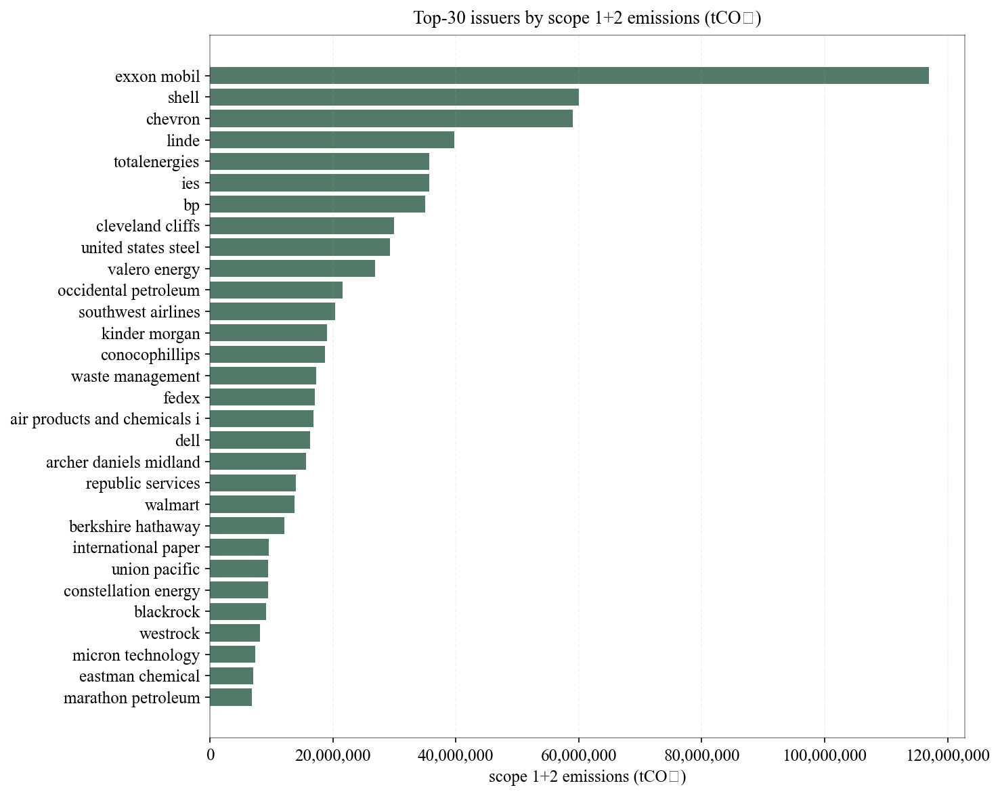

/var/folders/gw/vnsb934j7fvdc3rjq0d035h00000gn/T/ipykernel_31439/2784762009.py:58: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Times New Roman.
  plt.tight_layout()
/opt/anaconda3/envs/Dissertation/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Times New Roman.
  fig.canvas.print_figure(bytes_io, **kw)


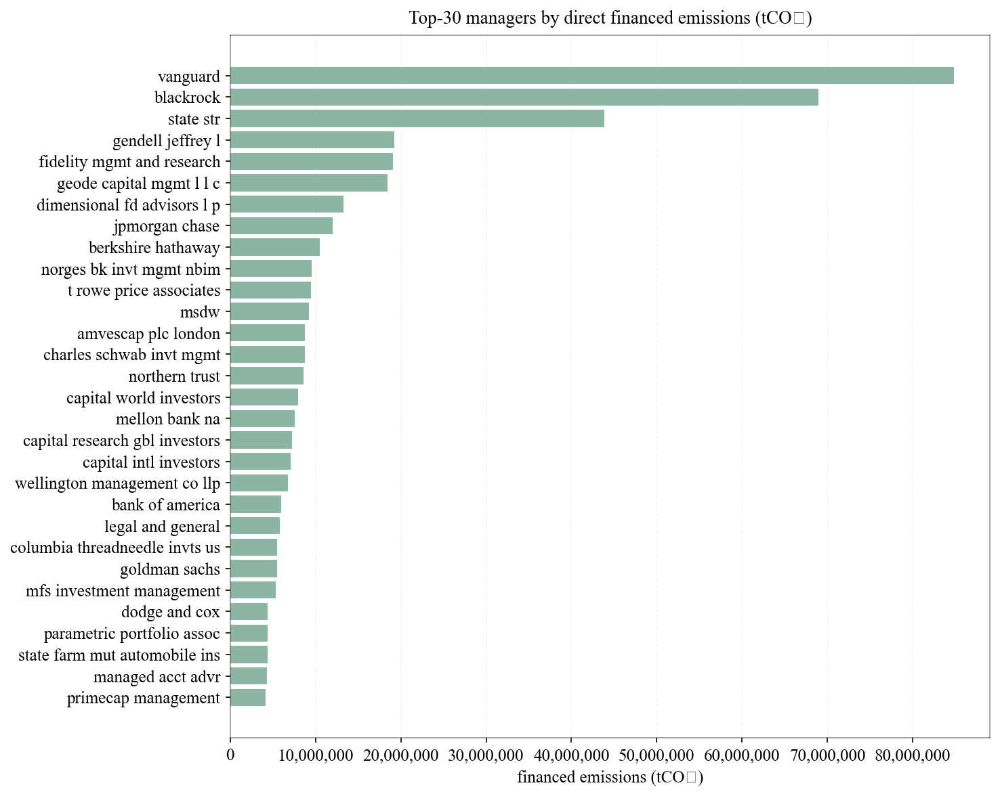

In [7]:
# ---------- FIX: build issuer-level Scope 1+2 (no double counting) ----------
# Start from df0 (the raw file you loaded), not the exploded edges table.
# 1) normalize the company key exactly as you did for edges
if '_company_key' not in df0.columns:
    from re import sub
    def norm_name(s: str) -> str:
        if not isinstance(s, str): s = "" if s is None else str(s)
        s = s.upper().replace("&", " AND ")
        s = sub(r"[^\w\s\-]", " ", s)
        s = sub(r"\s+", " ", s).strip()
        return s
    cmp_col = df0.filter(regex='(stock|stkname|company)', case=False).columns[0]
    df0['_company_key'] = df0[cmp_col].map(norm_name)

# 2) choose one Scope 1+2 per issuer (max is safest against small reporting noise)
#    If you trust a single source column, take it directly.
issuer_s12 = (df0
              .loc[:, ['_company_key', 's12']]
              .dropna(subset=['_company_key'])
              .groupby('_company_key')['s12']
              .max()  # <-- not sum
              .astype(float))

# ---------- Sanity check: how much did the edges table over-count? ----------
dup_factor = (edges.groupby('_company_key')['s12'].sum() /
              edges.groupby('_company_key')['s12'].max()).replace([np.inf, -np.inf], np.nan)

print("\nPotential over-counting (sum/max) — top 15 issuers by duplication factor:")
print(dup_factor.sort_values(ascending=False).head(15).to_string(float_format=lambda x: f"{x:,.1f}×"))

# ---------- Top 30 issuers (corrected) ----------
TOP = 30
top30_issuers = issuer_s12.sort_values(ascending=False).head(TOP)

# ---------- Manager financed emissions (unchanged) ----------
edges_fe = edges.copy()
edges_fe['fe'] = edges_fe['s12'].astype(float) * edges_fe['own_frac'].astype(float)
mgr_fe = edges_fe.groupby('_manager_key')['fe'].sum()

# ---------- Plotting (lower-case labels, muted greens) ----------
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter
mpl.rcParams["font.family"] = "Times New Roman"
mpl.rcParams["font.size"]   = 12

def plot_top(series, title, xlabel, top=30, color="#3E6C57", outfile=None):
    s = series.sort_values(ascending=False).head(top)[::-1]
    fig, ax = plt.subplots(figsize=(10, 8), dpi=150)
    ax.barh(range(len(s)), s.values, color=color, alpha=0.9)
    ax.set_yticks(range(len(s)))
    ax.set_yticklabels([str(k).lower() for k in s.index], fontsize=12)
    ax.set_xlabel(xlabel)
    ax.set_title(title, fontsize=13, pad=8)
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:,.0f}"))
    for spine in ax.spines.values(): spine.set_alpha(0.4)
    ax.grid(axis="x", alpha=0.15, linestyle="--")
    plt.tight_layout()
    if outfile: plt.savefig(outfile, dpi=200, bbox_inches="tight")
    plt.show()

plot_top(
    top30_issuers,
    title=f"Top-{TOP} issuers by scope 1+2 emissions (tCO₂)",
    xlabel="scope 1+2 emissions (tCO₂)",
    top=TOP,
    color="#3E6C57"
)

plot_top(
    mgr_fe,
    title=f"Top-{TOP} managers by direct financed emissions (tCO₂)",
    xlabel="financed emissions (tCO₂)",
    top=TOP,
    color="#7FAE99"
)


[eligibility] managers in df: 7940 | eligible: 6522


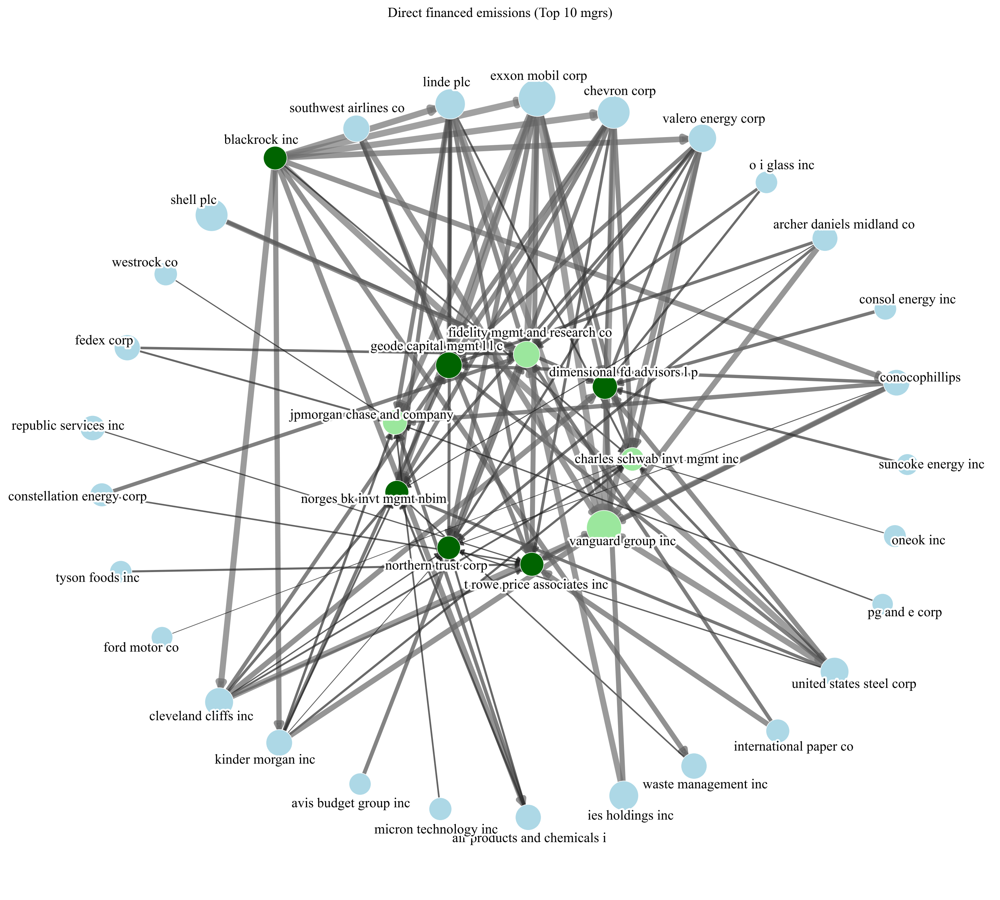

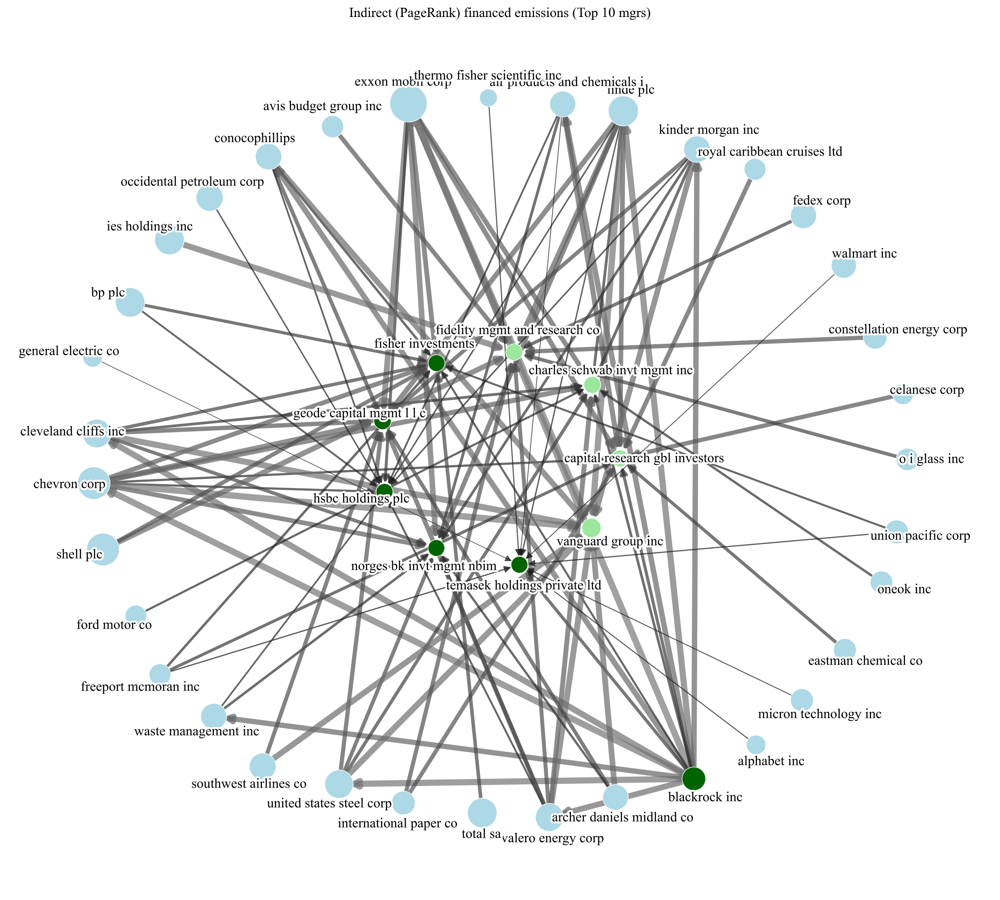

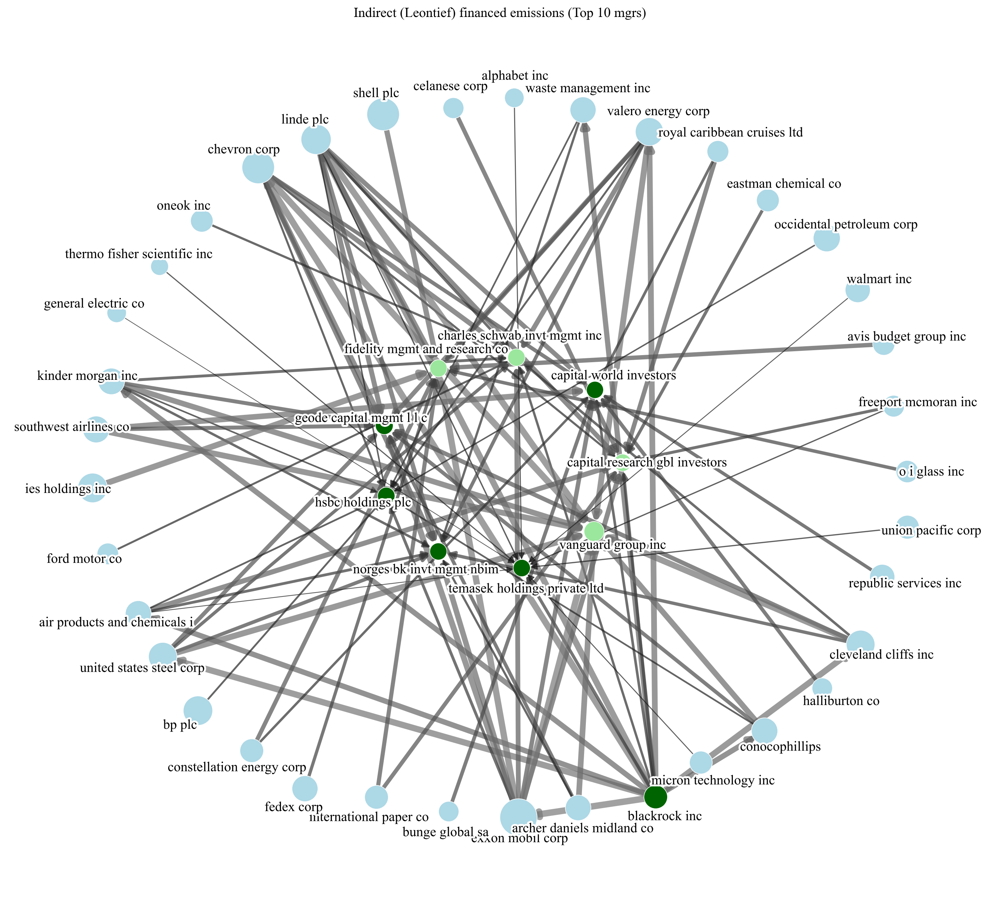

In [1]:
# ======================================================================
# Direct vs Indirect (PageRank & Leontief) — Radial Plots (STRICT MANAGERS)
# Managers in center, stocks on periphery; grey edges width ~ fe_edge
# ======================================================================
from pathlib import Path
import re, os
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe

# ------------------ Global Style ------------------
matplotlib.rcParams["font.family"] = "Times New Roman"
matplotlib.rcParams["font.size"]   = 12

# ------------------ Config ------------------
EDGES = Path("../../WRDS/financed_emissions_network_final_plus_manual.csv")  # update if needed
PR_ALPHA = 0.85

# ------------------ Helpers ------------------
def norm_name(s: str) -> str:
    if not isinstance(s, str): s = "" if s is None else str(s)
    s = s.upper().replace("&"," AND ")
    s = re.sub(r"[^\w\s]", " ", s)
    s = re.sub(r"\s+", " ", s).strip()
    return s

def is_fundlike(name: str) -> bool:
    FUND_WORDS = ("ETF","FUND","TRUST","INDEX","UCITS","ETN","ETFS","PORTFOLIO",
                  "TOTAL RETURN","TREASUR","BOND","DIVIDEND","INCOME","BETA",
                  "BETABUILDERS","MARKETBETA","ACCESS","SHARES","SPDR",
                  "ISHARES","VANGUARD","SCHWAB","MUTUAL","EXCHANGE TRADED")
    REIT_HINTS = ("REALTY TRUST","PROPERTIES","PROPERTY","REIT")
    s = str(name).upper()
    if any(h in s for h in REIT_HINTS): return False
    return any(w in s for w in FUND_WORDS)

def node_size_map_from_attrs(G, investor_attr="direct_fe", investee_attr="s12",
                             base=120.0, span=600.0):
    vals = []
    for n in G.nodes():
        role = G.nodes[n].get("role")
        v = (G.nodes[n].get(investor_attr, 0.0) if role in ("investor","both")
             else G.nodes[n].get(investee_attr, 0.0))
        vals.append(max(float(v), 0.0))
    M = max(vals) if vals else 0.0
    if M <= 0: return {n: base for n in G.nodes()}
    out = {}
    for n in G.nodes():
        role = G.nodes[n].get("role")
        v = (G.nodes[n].get(investor_attr, 0.0) if role in ("investor","both")
             else G.nodes[n].get(investee_attr, 0.0))
        out[n] = base + span*np.sqrt(float(v)/M)
    return out

# --- helper: flag fund-of-funds style managers by name (for coloring only) ---
_FOF_KEYS = (
    "BLACKROCK", "VANGUARD", "STATE STREET", "STATE STR",
    "JPMORGAN", "JP MORGAN", "CITIGROUP", "CITI",
    "BERKSHIRE HATHAWAY", "CHARLES SCHWAB", "SCHWAB",
    "FIDELITY", "CAPITAL RESEARCH", "MORGAN STANLEY",
    "GOLDMAN SACHS", "INVESCO", "ISHARES", "SPDR"
)
def is_fund_of_funds_manager(name: str) -> bool:
    s = str(name).upper()
    return any(k in s for k in _FOF_KEYS)

# ------------------ Load & prepare ------------------
df0 = pd.read_csv(EDGES, low_memory=False)

# Normalize names
df0["_manager_key"] = df0["manager"].astype(str).map(norm_name)
df0["_company_key"] = df0["stock"].astype(str).map(norm_name)
df0["is_fundlike"]  = df0["stock"].astype(str).map(is_fundlike)

# Keep usable rows
df0["ownership"] = pd.to_numeric(df0["ownership"], errors="coerce")
df0["scope12"]   = pd.to_numeric(df0["scope12_total_tco2"], errors="coerce")
df = df0.loc[df0["ownership"].notna() & df0["scope12"].notna()].copy()

# Drop fund-like investees (ETFs, indices, etc.)
df = df.loc[~df["is_fundlike"]].copy()

# Financed emissions per edge (manager->stock direction for raw table)
df["own_frac"] = (df["ownership"]/100.0).clip(lower=0.0)
df["fe_edge"]  = df["own_frac"] * df["scope12"]

# ------------------ Direct graph (manager -> stock) ------------------
G_inv = nx.DiGraph()
for _, r in df.iterrows():
    u, v, w = r["_manager_key"], r["_company_key"], float(r["own_frac"])
    if u and v and u != v and w > 0:
        G_inv.add_edge(u, v, w=w, fe_edge=r["fe_edge"])
        G_inv.nodes[v]["s12"] = r["scope12"]

# ------------------ Carbon-flow graph (stock -> manager) ------------------
G_cf = nx.DiGraph()
for n, d in G_inv.nodes(data=True):
    G_cf.add_node(n, **d)
for u, v, d in G_inv.edges(data=True):
    # flip to stock -> manager and carry fe_edge
    G_cf.add_edge(v, u, w=d.get("w", 0.0), fe_edge=d.get("fe_edge", 0.0))

# ------------------ Roles + direct_fe on nodes ------------------
investors = set(df["_manager_key"])
investees = set(df["_company_key"])
roles = {}
for n in G_cf.nodes():
    r_inv = n in investors
    r_iss = n in investees
    roles[n] = "both" if (r_inv and r_iss) else ("investor" if r_inv else "investee")
nx.set_node_attributes(G_cf, roles, "role")
nx.set_node_attributes(G_inv, roles, "role")

direct_mgr = df.groupby("_manager_key")["fe_edge"].sum().rename("direct_fe")
nx.set_node_attributes(G_cf, direct_mgr.to_dict(), "direct_fe")
nx.set_node_attributes(G_inv, direct_mgr.to_dict(), "direct_fe")

# ------------------ Indirect (anchored PageRank) ------------------
# Only the issuer-owned share is distributable
in_owned = {n: min(1.0, sum(G_cf[p][n].get("w", 0.0) for p in G_cf.predecessors(n))) for n in G_cf.nodes()}
distributable = pd.Series({n: float(G_cf.nodes[n].get("s12", 0.0)) for n in G_cf.nodes()})
s = (distributable * pd.Series(in_owned)).fillna(0.0)
S = float(s.sum())
personalization = (s / S).to_dict() if S > 0.0 else None  # uniform if nothing to distribute

pr = nx.pagerank(G_cf, alpha=PR_ALPHA, weight="w", personalization=personalization)
expanded_iS3 = {n: pr.get(n, 0.0) * S for n in G_cf.nodes()}
nx.set_node_attributes(G_cf, expanded_iS3, "indirect_fe")

# ------------------ Indirect (Leontief (I - A^T)^-1 s) ------------------
try:
    import scipy.sparse as sp
    import scipy.sparse.linalg as spla
    HAVE_SCIPY = True
except Exception:
    HAVE_SCIPY = False

nodes = list(G_cf.nodes())
idx = {n: i for i, n in enumerate(nodes)}
nN = len(nodes)

# Build A^T sparse/dense (edge u->v in G_cf => (A^T)[v,u] = w)
rows, cols, data = [], [], []
for u, v, d in G_cf.edges(data=True):
    w = float(d.get("w", 0.0))
    if w > 0 and u in idx and v in idx and u != v:
        rows.append(idx[v]); cols.append(idx[u]); data.append(w)

if HAVE_SCIPY:
    AT = sp.csr_matrix((data, (rows, cols)), shape=(nN, nN))
    col_sums = np.asarray(AT.sum(axis=0)).ravel()
    cap = 0.999
    scale = np.ones_like(col_sums)
    mask = col_sums > cap
    scale[mask] = cap / col_sums[mask]
    if mask.any():
        AT = AT @ sp.diags(scale)   # scale columns
    I = sp.eye(nN, format="csr")
    M = (I - AT) + 1e-9 * I
    s_vec = np.array([float(s.get(nm, 0.0)) for nm in nodes])
    try:
        y = spla.spsolve(M, s_vec)
    except Exception:
        y, info = spla.gmres(M, s_vec, tol=1e-8, restart=200, maxiter=500)
        if info != 0:
            y = np.linalg.solve(M.toarray(), s_vec)
else:
    AT = np.zeros((nN, nN), dtype=float)
    for r, c, w in zip(rows, cols, data):
        AT[r, c] = w
    col_sums = AT.sum(axis=0)
    cap = 0.999
    scale = np.ones_like(col_sums)
    mask = col_sums > cap
    scale[mask] = cap / col_sums[mask]
    AT = AT * scale
    M = (np.eye(nN) - AT) + 1e-9 * np.eye(nN)
    s_vec = np.array([float(s.get(nm, 0.0)) for nm in nodes])
    y = np.linalg.solve(M, s_vec)

y = np.maximum(y, 0.0)
nx.set_node_attributes(G_cf, {nodes[i]: float(y[i]) for i in range(nN)}, "leontief_fe")

# ======================================================================
# STRICT MANAGER ELIGIBILITY  (prevents issuers like ALPHABET appearing)
# ======================================================================
# Heuristic tokens typical of 13F filers / asset managers (on normalized names)
_MGR_KEYS = (
    "ADVISORS","ADVISER","ADVISERS","ADVISORY","ASSET","ASSETS",
    "CAPITAL","INVESTMENT","INVESTMENTS","INVESTORS","INVESTMENT MGMT",
    "MANAGEMENT","MGMT","PARTNERS","PARTNERSHIP","LLC","L.L.C","LTD","LP",
    "TRUST","BANK","WEALTH","SECURITIES","FINANCIAL","FUND","FUNDS",
    "ETRADE","SCHWAB","MERRILL","MORGAN","FIDELITY","BLACKROCK","VANGUARD",
    "STATE STREET","GEODE","DIMENSIONAL","NORTHERN","WELLS FARGO","RUSSELL",
    "JANUS","T ROWE","T. ROWE","JPMORGAN","JP MORGAN","GOLDMAN","INVESCO",
    "PIMCO","AMPLIFY","AMUNDI","HSBC","UBS","BARCLAYS","DEUTSCHE","NOMURA"
)
# Optional hard blacklist of well-known issuers (normalized)
MANAGER_BLACKLIST = {
    "ALPHABET","ALPHABET INC","APPLE","APPLE INC","MICROSOFT","MICROSOFT CORP",
    "AMAZON","AMAZON COM INC","NVIDIA","META PLATFORMS","TESLA","EXXON MOBIL",
    "CHEVRON","BROADCOM","ELI LILLY","BERKSHIRE HATHAWAY INC CLASS A",
    "BERKSHIRE HATHAWAY INC CLASS B"  # keep actual manager "BERKSHIRE HATHAWAY" allowed by tokens
}

def looks_like_manager(name: str) -> bool:
    s = str(name).upper()
    if s in MANAGER_BLACKLIST:
        return False
    return any(k in s for k in _MGR_KEYS)

MANAGER_MIN_EDGES = 5  # ↑ if you want to be stricter

mgr_counts = df["_manager_key"].value_counts()
eligible_managers = set(
    m for m, c in mgr_counts.items()
    if (c >= MANAGER_MIN_EDGES) and looks_like_manager(m)
)

# Overwrite roles on graphs using strict eligibility
roles_strict = {}
iss_set = set(df["_company_key"])
for n in G_cf.nodes():
    is_mgr = n in eligible_managers
    is_iss = n in iss_set
    roles_strict[n] = "both" if (is_mgr and is_iss) else ("investor" if is_mgr else ("investee" if is_iss else "unknown"))
nx.set_node_attributes(G_cf, roles_strict, "role")
nx.set_node_attributes(G_inv, roles_strict, "role")

print(f"[eligibility] managers in df: {len(mgr_counts)} | eligible: {len(eligible_managers)}")

# ------------------ Build top-10 subgraphs by metric (STRICT) ------------------
def top10_subgraph_by_metric(base_df, metric_name="direct_fe"):
    """
    Rank ONLY eligible managers by 'metric_name' and keep their top-10 investee edges by fe_edge.
    metric_name in {"direct_fe","indirect_fe","leontief_fe"}.
    """
    if metric_name == "direct_fe":
        mgr_scores = (
            base_df.loc[base_df["_manager_key"].isin(eligible_managers)]
                   .groupby("_manager_key")["fe_edge"]
                   .sum()
        )
    else:
        # Pull node metrics for eligible managers only (they all exist in G_cf)
        node_vals = {m: G_cf.nodes[m].get(metric_name, 0.0) for m in eligible_managers if m in G_cf.nodes}
        mgr_scores = pd.Series(node_vals)

    if mgr_scores.empty:
        print(f"[warning] No eligible managers for metric '{metric_name}'.")
        return nx.DiGraph()

    top_mgrs = mgr_scores.sort_values(ascending=False).head(10).index.tolist()

    keep_edges = []
    mask = base_df["_manager_key"].isin(top_mgrs)
    for m, sub in base_df.loc[mask].groupby("_manager_key"):
        sub = sub.sort_values("fe_edge", ascending=False).head(10)
        if not sub.empty:
            keep_edges.append(sub)

    if not keep_edges:
        return nx.DiGraph()
    keep_edges = pd.concat(keep_edges, ignore_index=True)

    G = nx.DiGraph()
    for _, r in keep_edges.iterrows():
        mkey = r["_manager_key"]; ckey = r["_company_key"]
        G.add_edge(mkey, ckey, w=r["own_frac"], fe_edge=r["fe_edge"])

        # manager metrics (safe access: node exists)
        dm = float(direct_mgr.get(mkey, 0.0))
        im = float(G_cf.nodes[mkey].get("indirect_fe", 0.0)) if mkey in G_cf.nodes else 0.0
        lm = float(G_cf.nodes[mkey].get("leontief_fe", 0.0))  if mkey in G_cf.nodes else 0.0

        G.nodes[mkey].update({"role": "investor", "direct_fe": dm, "indirect_fe": im, "leontief_fe": lm})
        G.nodes[ckey].update({"role": "investee", "s12": float(r["scope12"])})

    return G

G_dir_top = top10_subgraph_by_metric(df, "direct_fe")
G_pr_top  = top10_subgraph_by_metric(df, "indirect_fe")
G_leo_top = top10_subgraph_by_metric(df, "leontief_fe")

# ------------------ Drawing utilities (radial layout) ------------------
def get_top_idx(metric, k=30):
    """Return a set of top eligible managers by the chosen metric (for highlighting)."""
    if metric == "direct_fe":
        s = direct_mgr.loc[direct_mgr.index.intersection(eligible_managers)]
    elif metric in ("indirect_fe", "leontief_fe"):
        vals = {m: G_cf.nodes[m].get(metric, 0.0) for m in eligible_managers if m in G_cf.nodes}
        s = pd.Series(vals)
    else:
        return set()
    if s.empty:
        return set()
    return set(s.sort_values(ascending=False).head(k).index)

def to_stock_to_manager_flow(G_in: nx.DiGraph) -> nx.DiGraph:
    """Ensure edges go stock -> manager and carry fe_edge."""
    H = nx.DiGraph()
    for n, d in G_in.nodes(data=True):
        H.add_node(n, **d)
    for u, v, d in G_in.edges(data=True):
        ru = G_in.nodes[u].get("role", "")
        rv = G_in.nodes[v].get("role", "")
        fe = float(d.get("fe_edge", 0.0))
        if ru == "investor" and rv != "investor":
            src, dst = v, u
        elif rv == "investor" and ru != "investor":
            src, dst = u, v
        else:
            src, dst = u, v
        if src != dst:
            H.add_edge(src, dst, fe_edge=fe)
    return H

def radial_positions(H: nx.DiGraph, r_in=0.30, r_out=1.00, jitter=0.018, seed=42):
    rng = np.random.default_rng(seed)
    mgrs = [n for n, d in H.nodes(data=True) if d.get("role") in ("investor","both")]
    stks = [n for n, d in H.nodes(data=True) if d.get("role","investee") == "investee"]
    pos = {}
    if mgrs:
        ang_m = np.linspace(0, 2*np.pi, len(mgrs), endpoint=False)
        for a, n in zip(ang_m, mgrs):
            pos[n] = (r_in*np.cos(a) + rng.normal(0, jitter*0.3),
                      r_in*np.sin(a) + rng.normal(0, jitter*0.3))
    if stks:
        ang_s = np.linspace(0, 2*np.pi, len(stks), endpoint=False)
        rng.shuffle(ang_s)  # reduce collisions
        for a, n in zip(ang_s, stks):
            pos[n] = (r_out*np.cos(a) + rng.normal(0, jitter),
                      r_out*np.sin(a) + rng.normal(0, jitter))
    return pos

def draw_net_radial(G_in, title, metric_for_investors="direct_fe", node_scale=2.0):
    # Build flow view and positions (stock -> manager)
    H = to_stock_to_manager_flow(G_in)
    pos = radial_positions(H, r_in=0.30, r_out=1.00, jitter=0.018, seed=42)

    # Node sizes (investors by chosen metric, investees by s12)
    sizes = node_size_map_from_attrs(
        H, investor_attr=metric_for_investors, investee_attr="s12",
        base=120.0, span=600.0
    )
    node_sizes = [node_scale * sizes.get(n, 140.0) for n in H.nodes()]

    # Base colors: dark green for top managers, light blue otherwise
    highlight = get_top_idx(metric_for_investors, k=30)
    nodes_in_order = list(H.nodes())
    node_colors = ["#006400" if n in highlight else "#ADD8E6" for n in nodes_in_order]

    # Override: make *fund-of-funds managers* light green
    LIGHT_GREEN = "#9BE79D"
    for i, n in enumerate(nodes_in_order):
        role = H.nodes[n].get("role", "investee")
        if role in ("investor", "both") and is_fund_of_funds_manager(n):
            node_colors[i] = LIGHT_GREEN

    # --- Edges: straight, lighter Greys, width ~ fe_edge ---
    fe_vals = np.array([float(H[u][v].get("fe_edge", 0.0)) for u, v in H.edges()])
    if fe_vals.size == 0:
        fe_vals = np.array([1.0])
    ranks  = pd.Series(fe_vals).rank(method="average", pct=True).to_numpy()
    widths = 0.6 + 6.0 * (ranks ** 0.85)
    t      = 0.93 - 0.33 * ranks
    edge_colors = plt.cm.Greys(t)

    nx.draw_networkx_edges(
        H, pos, arrows=True, arrowstyle='-|>', arrowsize=14,
        edge_color=edge_colors, width=widths, alpha=0.70
    )
    nx.draw_networkx_nodes(
        H, pos, node_size=node_sizes, node_color=node_colors,
        linewidths=0.6, edgecolors='white'
    )

    # Labels (lowercase) with white halo
    pos_lbl = {}
    for n, (x, y) in pos.items():
        ang = np.arctan2(y, x); off = 0.06
        pos_lbl[n] = (x + off*np.cos(ang), y + off*np.sin(ang))
    labeldict = {n: str(n).lower() for n in H.nodes()}
    texts = nx.draw_networkx_labels(H, pos_lbl, labels=labeldict,
                                    font_size=14, font_family="Times New Roman")
    for t in texts.values():
        t.set_path_effects([pe.withStroke(linewidth=4.0, foreground="white")])
        t.set_zorder(3)

    plt.title(title, fontsize=14)
    plt.axis("off")

# ------------------ Plots (Top-10 views, one after another) ------------------
plt.figure(figsize=(18, 16), dpi=200)
draw_net_radial(G_dir_top, "Direct financed emissions (Top 10 mgrs)", "direct_fe", node_scale=2.0)
plt.show()

plt.figure(figsize=(18, 16), dpi=200)
draw_net_radial(G_pr_top, "Indirect (PageRank) financed emissions (Top 10 mgrs)", "indirect_fe", node_scale=2.0)
plt.show()

plt.figure(figsize=(18, 16), dpi=200)
draw_net_radial(G_leo_top, "Indirect (Leontief) financed emissions (Top 10 mgrs)", "leontief_fe", node_scale=2.0)
plt.show()


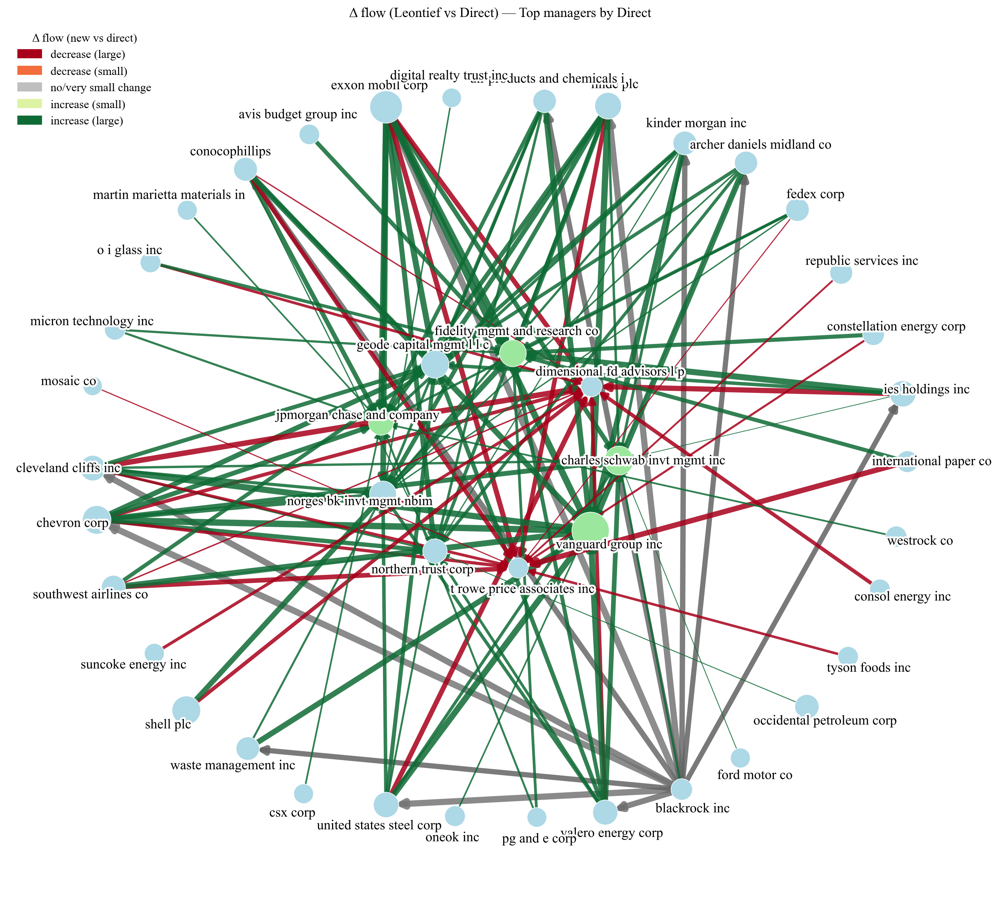

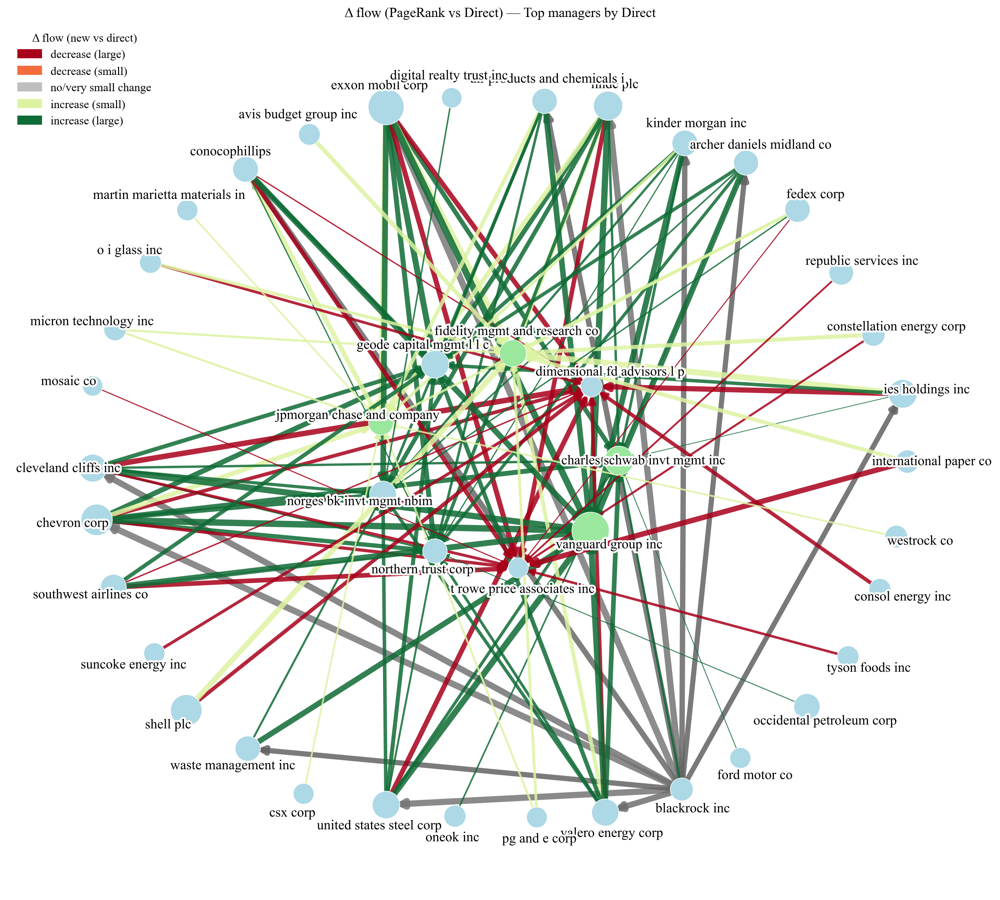

In [7]:
# ======================================================================
# FINAL BLOCK — Full-mass s, recompute PR & Leontief, and Δ vs Direct
# ======================================================================
import numpy as np, pandas as pd, networkx as nx, matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import matplotlib.patches as mpatches

# ---------- Assumptions ----------
# You already have: df, G_cf, direct_mgr (Series manager->direct_fe),
# eligible_managers (set), and edge field 'fe_edge' on G_cf edges.
# If not, run your earlier data-build cell first.

# ---------- 1) Build 's' with FULL ownership mass (comparable to Direct) ----------
PR_ALPHA = 0.85  # keep your damping

# sum of inbound ownership to each node (can exceed 1.0)
sum_in = {n: sum(G_cf[p][n].get("w", 0.0) for p in G_cf.predecessors(n)) for n in G_cf.nodes()}
owned_factor = sum_in  # FULL mass (no cap)

# distributable = issuer Scope1+2 on nodes (stocks have s12; managers often 0)
distributable = pd.Series({n: float(G_cf.nodes[n].get("s12", 0.0)) for n in G_cf.nodes()})
s = (distributable * pd.Series(owned_factor)).fillna(0.0)
S = float(s.sum())
personalization = (s / S).to_dict() if S > 0 else None

# ---------- Recompute PageRank totals (anchored) ----------
pr = nx.pagerank(G_cf, alpha=PR_ALPHA, weight="w", personalization=personalization)
indirect_tot = {n: pr.get(n, 0.0) * S for n in G_cf.nodes()}
nx.set_node_attributes(G_cf, indirect_tot, "indirect_fe")

# ---------- Recompute Leontief totals with updated 's' ----------
try:
    import scipy.sparse as sp, scipy.sparse.linalg as spla
    HAVE_SCIPY = True
except Exception:
    HAVE_SCIPY = False

nodes = list(G_cf.nodes()); idx = {n:i for i,n in enumerate(nodes)}; nN = len(nodes)
rows, cols, data = [], [], []
for u, v, d in G_cf.edges(data=True):
    w = float(d.get("w", 0.0))
    if w > 0 and u in idx and v in idx and u != v:
        # A^T with edge u->v => (A^T)[v,u] = w
        rows.append(idx[v]); cols.append(idx[u]); data.append(w)

if HAVE_SCIPY:
    AT = sp.csr_matrix((data, (rows, cols)), shape=(nN, nN))
    # cap column sums just below 1 for stability
    col_sums = np.asarray(AT.sum(axis=0)).ravel()
    cap = 0.999
    scale = np.ones_like(col_sums)
    mask = col_sums > cap
    if mask.any():
        scale[mask] = cap / col_sums[mask]
        AT = AT @ sp.diags(scale)
    I = sp.eye(nN, format="csr")
    M = (I - AT) + 1e-9 * I
    s_vec = np.array([float(s.get(nm, 0.0)) for nm in nodes])
    try:
        y = spla.spsolve(M, s_vec)
    except Exception:
        y, info = spla.gmres(M, s_vec, tol=1e-8, restart=200, maxiter=500)
        if info != 0:
            y = np.linalg.solve(M.toarray(), s_vec)
else:
    AT = np.zeros((nN, nN), float)
    for r, c, w in zip(rows, cols, data):
        AT[r, c] = w
    col_sums = AT.sum(axis=0); cap = 0.999
    scale = np.ones_like(col_sums); mask = col_sums > cap
    scale[mask] = cap / col_sums[mask]
    AT = AT * scale
    M = (np.eye(nN) - AT) + 1e-9*np.eye(nN)
    s_vec = np.array([float(s.get(nm, 0.0)) for nm in nodes])
    y = np.linalg.solve(M, s_vec)

y = np.maximum(y, 0.0)
nx.set_node_attributes(G_cf, {nodes[i]: float(y[i]) for i in range(nN)}, "leontief_fe")

# ---------- 2) Helpers for drawing (local copies; safe to re-define) ----------
def to_stock_to_manager_flow(G_in: nx.DiGraph) -> nx.DiGraph:
    H = nx.DiGraph()
    for n, d in G_in.nodes(data=True): H.add_node(n, **d)
    for u, v, d in G_in.edges(data=True):
        ru = G_in.nodes[u].get("role",""); rv = G_in.nodes[v].get("role","")
        fe = float(d.get("fe_edge", 0.0))
        if ru == "investor" and rv != "investor": src, dst = v, u
        elif rv == "investor" and ru != "investor": src, dst = u, v
        else: src, dst = u, v
        if src != dst: H.add_edge(src, dst, fe_edge=fe)
    return H

def radial_positions(H: nx.DiGraph, r_in=0.30, r_out=1.00, jitter=0.018, seed=42):
    rng = np.random.default_rng(seed)
    mgrs = [n for n,d in H.nodes(data=True) if d.get("role") in ("investor","both")]
    stks = [n for n,d in H.nodes(data=True) if d.get("role","investee") == "investee"]
    pos = {}
    if mgrs:
        ang = np.linspace(0, 2*np.pi, len(mgrs), endpoint=False)
        for a,n in zip(ang, mgrs):
            pos[n] = (r_in*np.cos(a)+rng.normal(0,jitter*0.3),
                      r_in*np.sin(a)+rng.normal(0,jitter*0.3))
    if stks:
        ang = np.linspace(0, 2*np.pi, len(stks), endpoint=False); rng.shuffle(ang)
        for a,n in zip(ang, stks):
            pos[n] = (r_out*np.cos(a)+rng.normal(0,jitter),
                      r_out*np.sin(a)+rng.normal(0,jitter))
    return pos

def node_size_map_from_attrs(G, investor_attr="direct_fe", investee_attr="s12",
                             base=120.0, span=600.0):
    vals = []
    for n in G.nodes():
        role = G.nodes[n].get("role")
        v = (G.nodes[n].get(investor_attr,0.0) if role in ("investor","both")
             else G.nodes[n].get(investee_attr,0.0))
        vals.append(max(float(v),0.0))
    M = max(vals) if vals else 0.0
    if M <= 0: return {n: base for n in G.nodes()}
    out = {}
    for n in G.nodes():
        role = G.nodes[n].get("role")
        v = (G.nodes[n].get(investor_attr,0.0) if role in ("investor","both")
             else G.nodes[n].get(investee_attr,0.0))
        out[n] = base + span*np.sqrt(float(v)/M)
    return out

# color for FoF (optional)
_FOF_KEYS = ("BLACKROCK","VANGUARD","STATE STREET","STATE STR","JPMORGAN","JP MORGAN",
             "FIDELITY","CAPITAL RESEARCH","MORGAN STANLEY","GOLDMAN SACHS","INVESCO",
             "ISHARES","SPDR","SCHWAB")
def is_fund_of_funds_manager(name: str) -> bool:
    s = str(name).upper(); return any(k in s for k in _FOF_KEYS)

# ---------- 3) Δ settings: fixed symmetric thresholds, raw comparison ----------
RESCALE_TO_DIRECT = False      # compare raw method totals vs Direct
RELATIVE_MODE     = True       # (new - direct)/|direct|
USE_QUANTILES     = False      # use fixed thresholds
SMALL_ABS         = 0.05       # ±5% = small/no change
LARGE_ABS         = 0.30       # ≥30% = large change
DELTA_EPS         = 1e-9
REL_CAP           = 3.0

COL_L_DEC, COL_S_DEC = "#A8001A", "#F26C3C"
COL_NONE,  COL_S_INC = "#BFBFBF", "#DDF3A3"
COL_L_INC            = "#0F6B35"
ISSUER_EDGE_BASE, ISSUER_EDGE_SPAN = 0.93, 0.33

def _rescaled_series(new_s: pd.Series, ref_s: pd.Series) -> pd.Series:
    new_on_ref = new_s.reindex(ref_s.index).fillna(0.0)
    if not RESCALE_TO_DIRECT:
        return new_on_ref
    denom = float(new_on_ref.sum())
    if denom <= DELTA_EPS:
        return new_on_ref
    scale = float(ref_s.sum()) / denom
    return new_on_ref * scale

def _delta_series(new_s: pd.Series, ref_s: pd.Series) -> pd.Series:
    if RELATIVE_MODE:
        return ((new_s - ref_s) / np.maximum(ref_s.abs(), DELTA_EPS)).clip(-REL_CAP, REL_CAP)
    else:
        return (new_s - ref_s)

def _manager_delta_colors(metric_name, eligible_set):
    direct = direct_mgr.loc[direct_mgr.index.intersection(eligible_set)].fillna(0.0)
    raw_new = pd.Series({m: float(G_cf.nodes[m].get(metric_name,0.0))
                         for m in eligible_set if m in G_cf.nodes}, dtype=float
                       ).reindex(direct.index).fillna(0.0)
    new_use = _rescaled_series(raw_new, direct)
    rel = _delta_series(new_use, direct)

    def cat(x):
        if x <= -LARGE_ABS: return COL_L_DEC
        if x <  -SMALL_ABS: return COL_S_DEC
        if -SMALL_ABS <= x <= SMALL_ABS: return COL_NONE
        if x <   LARGE_ABS: return COL_S_INC
        return COL_L_INC

    return rel.map(cat).to_dict()

def _make_legend(ax, title="Δ flow (new vs direct)"):
    patches = [
        mpatches.Patch(color=COL_L_DEC, label="decrease (large)"),
        mpatches.Patch(color=COL_S_DEC, label="decrease (small)"),
        mpatches.Patch(color=COL_NONE,  label="no/very small change"),
        mpatches.Patch(color=COL_S_INC, label="increase (small)"),
        mpatches.Patch(color=COL_L_INC, label="increase (large)"),
    ]
    ax.legend(handles=patches, title=title, loc="upper left",
              frameon=False, fontsize=12, title_fontsize=12)

def draw_net_radial_delta(G_in, title, metric_name, node_scale=2.0):
    # colors by manager delta
    mgr_colors = _manager_delta_colors(metric_name, eligible_managers)

    H = to_stock_to_manager_flow(G_in)
    pos = radial_positions(H, r_in=0.30, r_out=1.00, jitter=0.018, seed=42)

    sizes = node_size_map_from_attrs(H, investor_attr=metric_name, investee_attr="s12",
                                     base=120.0, span=600.0)
    node_sizes = [node_scale * sizes.get(n, 140.0) for n in H.nodes()]

    # simple node colors (blue investors unless FoF)
    nodes_in_order = list(H.nodes())
    node_colors = ["#ADD8E6"] * len(nodes_in_order)
    LIGHT_GREEN = "#9BE79D"
    for i, n in enumerate(nodes_in_order):
        role = H.nodes[n].get("role","investee")
        if role in ("investor","both") and is_fund_of_funds_manager(n):
            node_colors[i] = LIGHT_GREEN

    edge_list = list(H.edges())
    fe_vals = np.array([float(H[u][v].get("fe_edge", 0.0)) for u,v in edge_list]) if edge_list else np.array([1.0])
    ranks  = pd.Series(fe_vals).rank(method="average", pct=True).to_numpy()
    widths = 0.6 + 6.0 * (ranks ** 0.85)
    greys  = plt.cm.Greys(ISSUER_EDGE_BASE - ISSUER_EDGE_SPAN * ranks)

    edge_colors = []
    for (u,v), gcol in zip(edge_list, greys):
        v_role = H.nodes[v].get("role","")
        if v_role in ("investor","both"):
            edge_colors.append(mgr_colors.get(v, COL_NONE))
        else:
            edge_colors.append(gcol)

    nx.draw_networkx_edges(H, pos, arrows=True, arrowstyle='-|>', arrowsize=14,
                           edge_color=edge_colors, width=widths, alpha=0.85)
    nx.draw_networkx_nodes(H, pos, node_size=node_sizes, node_color=node_colors,
                           linewidths=0.6, edgecolors='white')

    # labels
    pos_lbl = {}
    for n,(x,y) in pos.items():
        ang = np.arctan2(y,x); off=0.06
        pos_lbl[n]=(x+off*np.cos(ang), y+off*np.sin(ang))
    texts = nx.draw_networkx_labels(H, pos_lbl, labels={n:str(n).lower() for n in H.nodes()},
                                    font_size=14, font_family="Times New Roman")
    for t in texts.values():
        t.set_path_effects([pe.withStroke(linewidth=4.0, foreground="white")])
        t.set_zorder(3)

    plt.title(title, fontsize=14)
    _make_legend(plt.gca())
    plt.axis("off")

# ---------- 4) Fix selection bias: use same manager set (top by Direct) ----------
TOPN_DIRECT        = 10   # managers
TOPK_EDGES_PER_MGR = 12   # investees per manager

def subgraph_for_managers(base_df, manager_list, topk_edges=TOPK_EDGES_PER_MGR):
    subrows = []
    mask = base_df["_manager_key"].isin(manager_list)
    for m, sub in base_df.loc[mask].groupby("_manager_key"):
        sub = sub.sort_values("fe_edge", ascending=False).head(topk_edges)
        if not sub.empty:
            subrows.append(sub)
    if not subrows: return nx.DiGraph()
    keep_edges = pd.concat(subrows, ignore_index=True)

    G = nx.DiGraph()
    for _, r in keep_edges.iterrows():
        mkey, ckey = r["_manager_key"], r["_company_key"]
        G.add_edge(mkey, ckey, w=r["own_frac"], fe_edge=r["fe_edge"])
        # attach metrics
        dm = float(direct_mgr.get(mkey, 0.0))
        im = float(G_cf.nodes[mkey].get("indirect_fe", 0.0)) if mkey in G_cf.nodes else 0.0
        lm = float(G_cf.nodes[mkey].get("leontief_fe", 0.0))  if mkey in G_cf.nodes else 0.0
        G.nodes[mkey].update({"role":"investor","direct_fe":dm,"indirect_fe":im,"leontief_fe":lm})
        G.nodes[ckey].update({"role":"investee","s12": float(r["scope12"])})
    return G

top_direct_mgrs = (direct_mgr.loc[direct_mgr.index.intersection(eligible_managers)]
                   .sort_values(ascending=False).head(TOPN_DIRECT).index.tolist())
G_top_direct = subgraph_for_managers(df, top_direct_mgrs, TOPK_EDGES_PER_MGR)

# ---------- 5) Draw the two Δ comparisons on the SAME manager set ----------
plt.figure(figsize=(18, 16), dpi=200)
draw_net_radial_delta(G_top_direct, "Δ flow (Leontief vs Direct) — Top managers by Direct",
                      metric_name="leontief_fe", node_scale=2.0)
plt.show()

plt.figure(figsize=(18, 16), dpi=200)
draw_net_radial_delta(G_top_direct, "Δ flow (PageRank vs Direct) — Top managers by Direct",
                      metric_name="indirect_fe", node_scale=2.0)
plt.show()
